In [2]:
import helper_classes.data_retriever as dr
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import helper_classes.geoprocessor as geo

# NOTE: Retrieved data are all in the context of 2019 for pre-COVID19 Pandemic Purposes

# Data Retrieval
nyc_gdf = dr.retrieve_census_tiger_shapefile_dataframe()
sebg_df = dr.retrieve_socialexplorer_blockgroup_data()
networkx_df = dr.retrieve_networkx_result("networkx_analysis.csv")

# Shapefile and Social Explorer Census Data Join into a Geodataframe
nyc_df = pd.merge(sebg_df, nyc_gdf, left_on='Geo_FIPS', right_on='GEOID')
nyc_gdf = gpd.GeoDataFrame(nyc_df, geometry='geometry')


In [3]:

networkx_gdf = gpd.GeoDataFrame(
    networkx_df,
    geometry=gpd.points_from_xy(networkx_df.stop_lon, networkx_df.stop_lat)
)
networkx_gdf.geometry = networkx_gdf.buffer(0.01)


In [4]:
# Conducting second method of evaluating weight for networkx analysis
# first find nodes from networkx_df
networkx_gdf

,station_id,stop_lat,stop_lon,clse,btwn,geometry
0,101,40.889248,-73.898583,0.000190,0.000000,"POLYGON ((-73.88858 40.88925, -73.88863 40.888..."
1,103,40.884667,-73.900870,0.000193,0.004866,"POLYGON ((-73.89087 40.88467, -73.89092 40.883..."
2,104,40.878856,-73.904834,0.000219,0.009709,"POLYGON ((-73.89483 40.87886, -73.89488 40.877..."
3,106,40.874561,-73.909831,0.000239,0.014527,"POLYGON ((-73.89983 40.87456, -73.89988 40.873..."
4,107,40.869444,-73.915279,0.000244,0.019322,"POLYGON ((-73.90528 40.86944, -73.90533 40.868..."
...,...,...,...,...,...,...
407,R42,40.634967,-74.023377,0.000295,0.014527,"POLYGON ((-74.01338 40.63497, -74.01343 40.633..."
408,R43,40.629742,-74.025510,0.000249,0.009709,"POLYGON ((-74.01551 40.62974, -74.01556 40.628..."
409,R44,40.622687,-74.028398,0.000236,0.004866,"POLYGON ((-74.01840 40.62269, -74.01845 40.621..."
410,R45,40.616622,-74.030876,0.000230,0.000000,"POLYGON ((-74.02088 40.61662, -74.02092 40.615..."


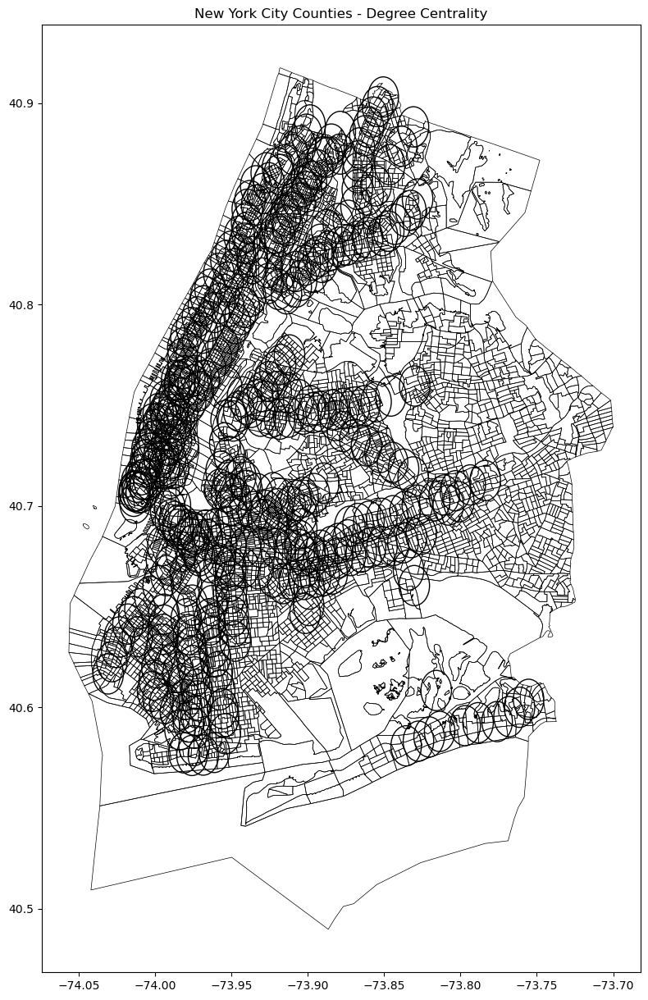

In [5]:
from matplotlib.patches import Circle

# Create a choropleth map of New York City counties based on the degree centrality
fig, ax = plt.subplots(figsize=(15, 15))

# Add block group boundaries
nyc_gdf.plot(linewidth=0.5, edgecolor='black', facecolor='none', ax=ax)

# Add circles for each point with the buffer radius as the circle's radius
for point in networkx_gdf.itertuples():
    ax.add_patch(Circle(xy=point.geometry.centroid.coords[0], radius=0.01, edgecolor='black', facecolor='none'))

ax.set_title('New York City Counties - Degree Centrality')
plt.show()

In [13]:
networkx_df

,station_id,stop_lat,stop_lon,dgrs,clse,btwn,stop_name
0,101,40.889248,-73.898583,0.004866,0.052558,0.000000,Van Cortlandt Park-242 St
1,103,40.884667,-73.900870,0.009732,0.055466,0.004866,238 St
2,104,40.878856,-73.904834,0.009732,0.058698,0.009709,231 St
3,106,40.874561,-73.909831,0.009732,0.062310,0.014527,Marble Hill-225 St
4,107,40.869444,-73.915279,0.009732,0.066376,0.019322,215 St
...,...,...,...,...,...,...,...
407,R42,40.634967,-74.023377,0.009732,0.098114,0.014527,Bay Ridge Av
408,R43,40.629742,-74.025510,0.009732,0.089445,0.009709,77 St
409,R44,40.622687,-74.028398,0.009732,0.082151,0.004866,86 St
410,R45,40.616622,-74.030876,0.004866,0.075928,0.000000,Bay Ridge-95 St


In [16]:
networkx_df = geo.aggregate_nyc_census_variable_to_networkx_weight('ACS19_5yr_B01001001', 'Geo_AREALAND',
                                                                   networkx_df=networkx_df,
                                                                   nyc_gdf=nyc_gdf,
                                                                   meters=1000)


c:\Users\cjong\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3457: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\cjong\Projects\python\analysis_of_nyc_subway_commute_patterns\geopanda_analysis\helper_classes\geoprocessor.py:42: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4269

  joined_df = gpd.sjoin(networkx_gdf, nyc_gdf, how='left', op='intersects')\


In [18]:
networkx_df.to_csv('station_populations.csv', index=False)

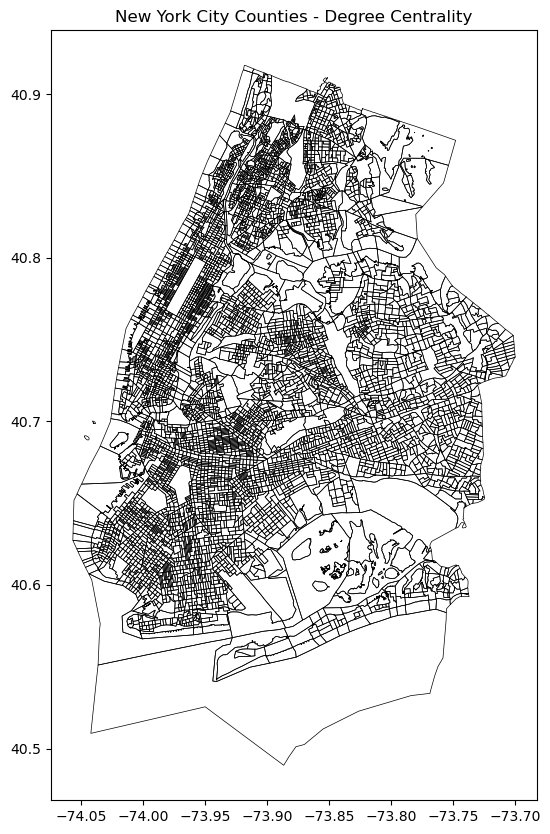

In [2]:

# Create a choropleth map of New York City counties based on the degree centrality
fig, ax = plt.subplots(figsize=(10, 10))

# Add block group boundaries
nyc_gdf.plot(linewidth=0.5, edgecolor='black', facecolor='none', ax=ax)

ax.set_title('New York City Counties - Degree Centrality')
plt.show()

In [3]:

# Remove parks and/or water via a filter
nyc_gdf = nyc_gdf[(nyc_gdf['ALAND'] > 0) & (nyc_gdf['ACS19_5yr_B01001001'] / nyc_gdf['ALAND'].apply(lambda x: pd.np.sqrt(x)) > 0.023)]

C:\Users\cjong\AppData\Local\Temp\ipykernel_9844\3429109671.py:2: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead.
  nyc_gdf = nyc_gdf[(nyc_gdf['ALAND'] > 0) & (nyc_gdf['ACS19_5yr_B01001001'] / nyc_gdf['ALAND'].apply(lambda x: pd.np.sqrt(x)) > 0.023)]


In [4]:


# Create 500, 1000, 2000, and 5000 km radiuses

nyc_gdf = geo.aggregate_join_nyc_to_buffered_networkx_stations('_radius_500', nyc_gdf, networkx_df, 500)
nyc_gdf = geo.aggregate_join_nyc_to_buffered_networkx_stations('_radius_1000', nyc_gdf, networkx_df, 1000)
nyc_gdf = geo.aggregate_join_nyc_to_buffered_networkx_stations('_radius_2000', nyc_gdf, networkx_df, 2000)
nyc_gdf = geo.aggregate_join_nyc_to_buffered_networkx_stations('_radius_5000', nyc_gdf, networkx_df, 5000)


c:\Users\cjong\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3457: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\cjong\Projects\python\analysis_of_nyc_subway_commute_patterns\geopanda_analysis\helper_classes\geoprocessor.py:15: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:4269
Right CRS: None

  joined_mean_df = gpd.sjoin(nyc_gdf, networkx_gdf, how='left', op='intersects')\
c:\Users\cjong\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3457: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\cjong\Projects\python\analys

# Census Data Analysis

### Aggregate Number Of Vehicles (Car Truck Or Van) Used In Commuting,ACS19_5yr_B08015001


In [16]:
# fig, ax = plt.subplots(figsize=(20, 20))

# nyc_gdf.plot(column='ACS19_5yr_B08015001', cmap='YlOrRd', legend=True, ax=ax)
# nyc_gdf.plot(linewidth=0.5, edgecolor='black', facecolor='none', ax=ax)
# ax.set_title('New York City - inverse_vehicle_use')
# plt.show()

# nyc_gdf.ACS19_5yr_B08015001

## Civilian Population in Labor Force 16 Years and Over:,SE_A17005_001

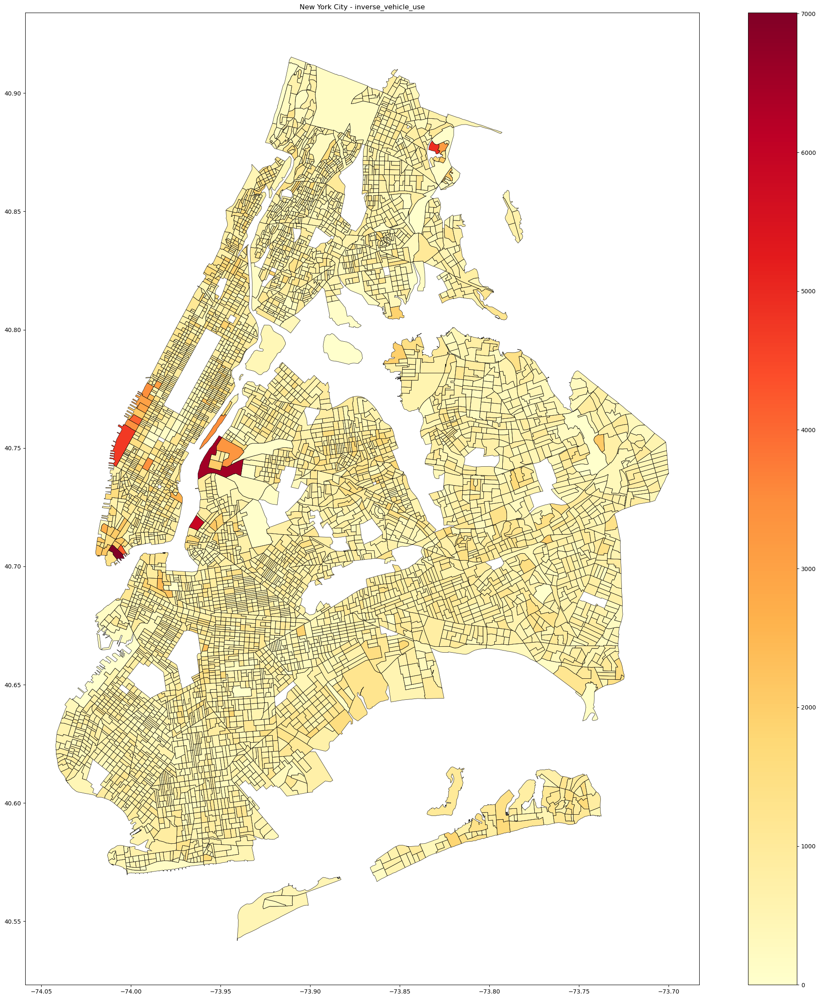

0         0
1       640
2       579
3       569
4       362
       ... 
5903    490
5904    826
5905    672
5906    619
5907    730
Name: SE_A17005_001, Length: 5908, dtype: int64

In [17]:
fig, ax = plt.subplots(figsize=(30, 30))

nyc_gdf.plot(column='SE_A17005_001', cmap='YlOrRd', legend=True, ax=ax)
nyc_gdf.plot(linewidth=0.5, edgecolor='black', facecolor='none', ax=ax)
ax.set_title('New York City - inverse_vehicle_use')
plt.show()
nyc_gdf.SE_A17005_001

## inverse_vehicle_use

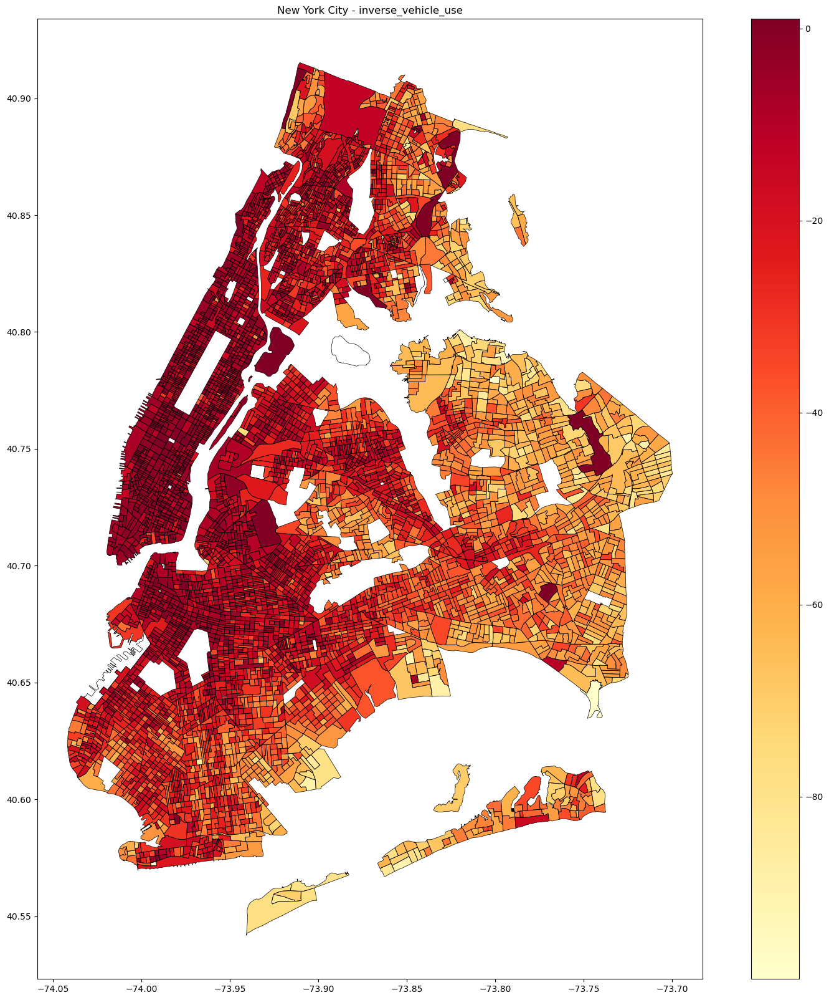

In [18]:
fig, ax = plt.subplots(figsize=(20, 20))

# nyc_gdf['inverse_vehicle_use'] = 1 - nyc_gdf['PCT_ACS19_5yr_B08134011']
nyc_gdf['inverse_vehicle_use'] = 1 - nyc_gdf['PCT_ACS19_5yr_B08301002']
nyc_gdf.plot(column='inverse_vehicle_use', cmap='YlOrRd', legend=True, ax=ax)
nyc_gdf.plot(linewidth=0.5, edgecolor='black', facecolor='none', ax=ax)
ax.set_title('New York City - inverse_vehicle_use')
plt.show()


## people density

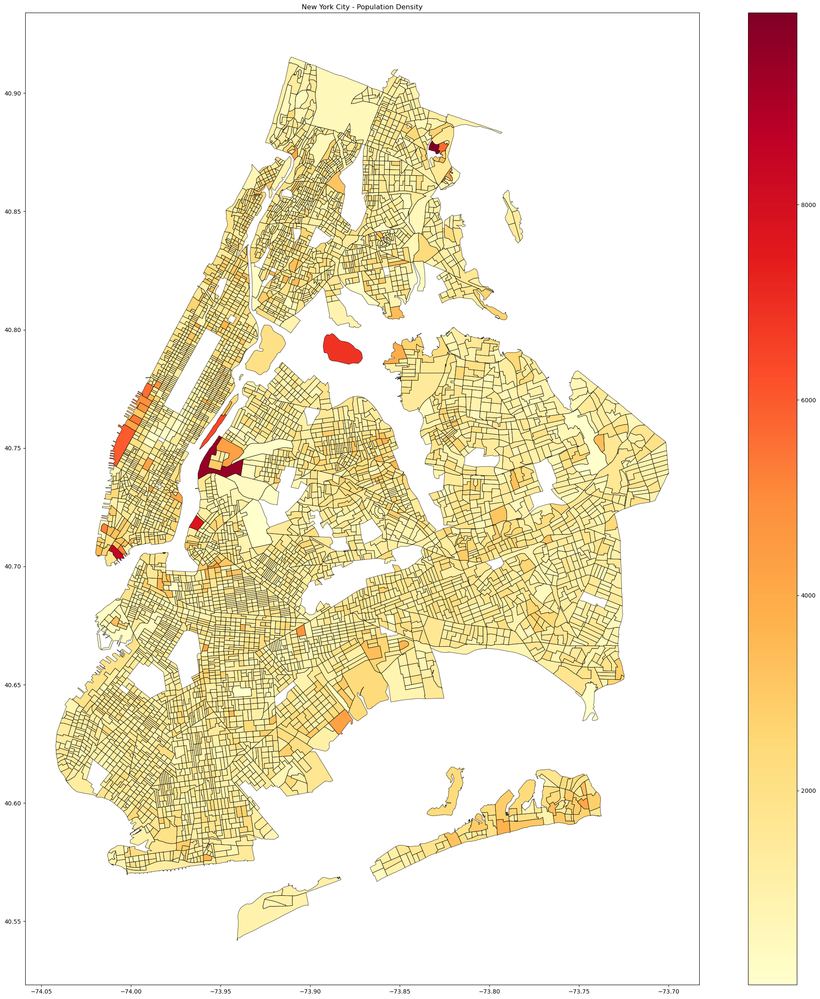

In [19]:
fig, ax = plt.subplots(figsize=(30, 30))
nyc_gdf.plot(column='ACS19_5yr_B01001001', cmap='YlOrRd', legend=True, ax=ax)
nyc_gdf.plot(linewidth=0.5, edgecolor='black', facecolor='none', ax=ax)
ax.set_title('New York City - Populativon Density')
plt.show()

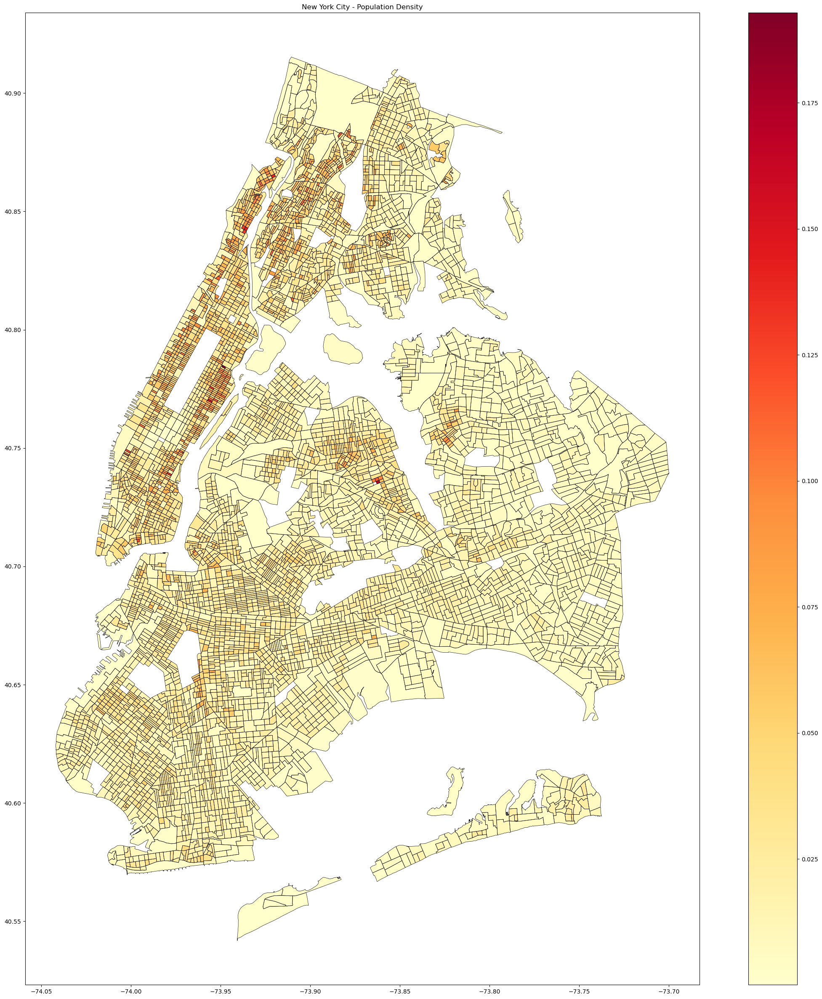

In [20]:
fig, ax = plt.subplots(figsize=(30, 30))
nyc_gdf['pop_density'] = nyc_gdf['ACS19_5yr_B01001001'] / nyc_gdf['Geo_AREALAND']
nyc_gdf.plot(column='pop_density', cmap='YlOrRd', legend=True, ax=ax)
nyc_gdf.plot(linewidth=0.5, edgecolor='black', facecolor='none', ax=ax)
ax.set_title('New York City - Population Density')
plt.show()


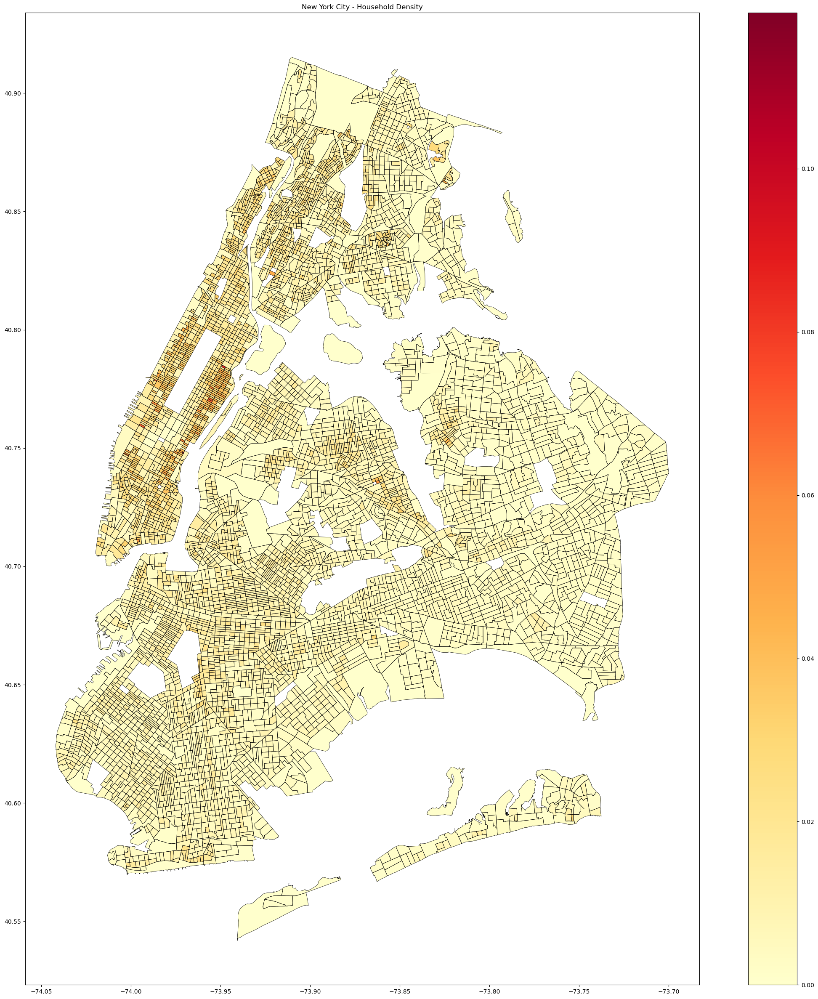

In [21]:
fig, ax = plt.subplots(figsize=(30, 30))
nyc_gdf['household_density'] = nyc_gdf['ACS19_5yr_B11001001'] / nyc_gdf['Geo_AREALAND']
nyc_gdf.plot(column='household_density', cmap='YlOrRd', legend=True, ax=ax)
nyc_gdf.plot(linewidth=0.5, edgecolor='black', facecolor='none', ax=ax)
ax.set_title('New York City - Household Density')
plt.show()


In [22]:
# TODO: select applicable ML model




In [23]:
import numpy as np
# Clean Data
# zip is not included beacuse that's an index, not a calculated value
df = nyc_gdf[['PCT_ACS19_5yr_B08134011',
            'PCT_ACS19_5yr_B08134061',
            'PCT_ACS19_5yr_B08134082',
            'PCT_ACS19_5yr_B08134083',
            'PCT_ACS19_5yr_B08134084',
            'PCT_ACS19_5yr_B08134085',
            'PCT_ACS19_5yr_B08134086',
            'PCT_ACS19_5yr_B08134087',
            'PCT_ACS19_5yr_B08134088',
            'PCT_ACS19_5yr_B08134089',
            'PCT_ACS19_5yr_B08134090',
            'PCT_ACS19_5yr_B08134091',
            'ACS19_5yr_B08301021',
            'PCT_ACS19_5yr_B08301012',
            'PCT_ACS19_5yr_B08301014',
            'PCT_ACS19_5yr_B08301021',
            'PCT_ACS19_5yr_B08134081']]

np.any(np.isnan(df))
np.all(np.isfinite(df))

df=df.dropna()

from sklearn.cluster import KMeans
import seaborn as sns; sns.set()  # for plot styling

number_of_cluters = 50
kmeans = KMeans(n_clusters=number_of_cluters, n_init=100) # default is 10

y_kmeans = kmeans.fit_predict(df)
df['cluster'] = kmeans.labels_

df = df.groupby('cluster').mean() #cluster means

df = df.sort_values(by=['PCT_ACS19_5yr_B08134081'], ascending=False)
df

,PCT_ACS19_5yr_B08134011,PCT_ACS19_5yr_B08134061,PCT_ACS19_5yr_B08134082,PCT_ACS19_5yr_B08134083,PCT_ACS19_5yr_B08134084,PCT_ACS19_5yr_B08134085,PCT_ACS19_5yr_B08134086,PCT_ACS19_5yr_B08134087,PCT_ACS19_5yr_B08134088,PCT_ACS19_5yr_B08134089,PCT_ACS19_5yr_B08134090,PCT_ACS19_5yr_B08134091,ACS19_5yr_B08301021,PCT_ACS19_5yr_B08301012,PCT_ACS19_5yr_B08301014,PCT_ACS19_5yr_B08301021,PCT_ACS19_5yr_B08134081
cluster,,,,,,,,,,,,,,,,,
16,6.710909,87.083561,0.538939,0.468258,0.784697,3.123409,2.868182,13.059167,15.451742,21.218409,24.234167,0.537500,2.727273,81.066970,0.237803,0.535833,81.747727
32,7.202549,85.125098,0.149216,0.240098,0.736275,3.070980,3.708922,14.969020,23.919020,23.482059,10.469412,1.275000,29.774510,76.732059,0.061765,4.897843,80.744804
46,6.718229,82.401667,0.157812,0.569479,2.364583,8.784375,7.083750,28.199583,13.979896,10.151354,6.156354,1.319271,17.895833,74.824375,0.287500,3.046563,77.446771
10,6.934483,81.650172,0.302845,0.317845,2.461724,6.019655,5.691983,21.795086,17.966810,15.241466,7.185776,1.204741,62.784483,69.810517,0.188017,8.982069,76.982931
47,8.631263,80.220421,0.287684,0.269263,1.352632,4.367579,3.640105,13.333474,16.659368,21.728842,13.204632,1.212421,95.031579,66.348000,0.036632,11.260842,74.841263
20,10.598900,81.927400,0.129600,0.424100,1.422700,1.612300,1.145000,9.070900,9.816000,19.248000,31.615200,1.344700,30.920000,70.315900,0.021200,5.462900,74.483800
2,8.926552,78.783103,0.256379,1.013276,1.879138,4.800690,4.701379,16.357586,13.085000,19.654483,11.413793,1.430345,130.758621,62.848448,0.402586,13.512414,73.161207
25,6.336000,77.798000,0.000000,0.000000,1.280000,8.956000,14.772000,21.642000,11.952000,7.610000,5.700000,4.838000,352.400000,56.136000,0.000000,21.368000,71.916000
34,13.131923,82.335128,0.285897,0.017051,0.405385,0.612821,0.765256,4.083846,2.544231,7.298205,55.228718,1.345769,4.589744,70.114872,0.029231,1.402949,71.240000


<AxesSubplot: ylabel='cluster'>

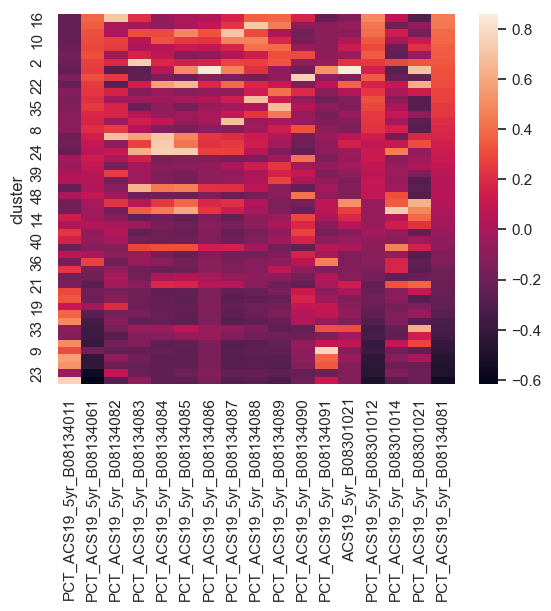

In [24]:
df_norm = (df - df.mean()) / (df.max() - df.min())
sns.heatmap(df_norm)

In [25]:
import numpy as np
# Clean Data
# zip is not included beacuse that's an index, not a calculated value
df = nyc_gdf[['PCT_ACS19_5yr_B08134011',
            'PCT_ACS19_5yr_B08134061',
            'PCT_ACS19_5yr_B08134082',
            'PCT_ACS19_5yr_B08134083',
            'PCT_ACS19_5yr_B08134084',
            'PCT_ACS19_5yr_B08134085',
            'PCT_ACS19_5yr_B08134086',
            'PCT_ACS19_5yr_B08134087',
            'PCT_ACS19_5yr_B08134088',
            'PCT_ACS19_5yr_B08134089',
            'PCT_ACS19_5yr_B08134090',
            'PCT_ACS19_5yr_B08134091',
            'ACS19_5yr_B08301021',
            'PCT_ACS19_5yr_B08301012',
            'PCT_ACS19_5yr_B08301014',
            'PCT_ACS19_5yr_B08301021',
            'PCT_ACS19_5yr_B08134081',
            'dgrs_mean_radius_500',
            'dgrs_mean_radius_1000',
            'dgrs_mean_radius_2000',
            'clse_mean_radius_500',
            'clse_mean_radius_1000',
            'clse_mean_radius_2000',
            'btwn_mean_radius_500',
            'btwn_mean_radius_1000',
            'btwn_mean_radius_2000'
            ]]

np.any(np.isnan(df))
np.all(np.isfinite(df))

df=df.dropna()

from sklearn.cluster import KMeans
import seaborn as sns; sns.set()  # for plot styling

number_of_cluters = 10
kmeans = KMeans(n_clusters=number_of_cluters, n_init=100) # default is 10

y_kmeans = kmeans.fit_predict(df)
df['cluster'] = kmeans.labels_

df = df.groupby('cluster').mean() #cluster means

df = df.sort_values(by=['PCT_ACS19_5yr_B08134081'], ascending=False)
df

,PCT_ACS19_5yr_B08134011,PCT_ACS19_5yr_B08134061,PCT_ACS19_5yr_B08134082,PCT_ACS19_5yr_B08134083,PCT_ACS19_5yr_B08134084,PCT_ACS19_5yr_B08134085,PCT_ACS19_5yr_B08134086,PCT_ACS19_5yr_B08134087,PCT_ACS19_5yr_B08134088,PCT_ACS19_5yr_B08134089,...,PCT_ACS19_5yr_B08134081,dgrs_mean_radius_500,dgrs_mean_radius_1000,dgrs_mean_radius_2000,clse_mean_radius_500,clse_mean_radius_1000,clse_mean_radius_2000,btwn_mean_radius_500,btwn_mean_radius_1000,btwn_mean_radius_2000
cluster,,,,,,,,,,,,,,,,,,,,,
6,9.031476,81.696432,0.261476,0.284675,1.199227,4.017135,3.670334,16.697452,16.216819,19.336591,...,76.081441,0.012597,0.012795,0.012739,0.098263,0.098181,0.098358,0.026263,0.027381,0.026939
5,9.481850,77.646890,0.359062,0.424718,2.173780,5.394611,4.529142,15.181046,13.746220,17.234316,...,71.834745,0.013571,0.013242,0.013390,0.102290,0.101954,0.102072,0.030560,0.029525,0.030897
1,17.640355,74.361286,0.149933,0.325432,0.657605,1.261353,0.763060,5.604479,5.680643,13.903415,...,64.039202,0.011167,0.011289,0.011562,0.083805,0.084019,0.084378,0.017920,0.018748,0.020476
3,7.229804,69.953529,0.147451,0.252157,2.933137,8.383137,5.634902,17.995490,9.586667,10.781373,...,63.024118,0.014504,0.013953,0.013879,0.108784,0.107808,0.108265,0.039019,0.032187,0.030481
9,17.482936,67.284611,0.207686,0.408135,1.447858,3.728739,2.186546,9.616580,8.869516,14.861848,...,58.160484,0.012473,0.012589,0.012613,0.094921,0.095063,0.095004,0.027221,0.026450,0.025735
7,11.270180,62.692335,0.103772,0.760719,2.869102,7.789820,4.331856,12.569760,8.881617,10.149401,...,56.095509,0.014486,0.014171,0.014205,0.107273,0.106562,0.106491,0.040128,0.034713,0.032932
8,17.583333,64.578411,0.194767,0.351764,1.165523,2.653333,2.065310,9.098469,7.061279,13.234050,...,50.083605,0.012713,0.012675,0.012659,0.094688,0.094576,0.093902,0.030153,0.028959,0.026534
4,35.118074,54.356259,0.158759,0.115296,0.318852,0.710593,0.451500,3.053130,3.195870,8.329389,...,41.119704,0.010653,0.010927,0.011221,0.079193,0.079439,0.080249,0.017628,0.018389,0.019212
0,17.714091,48.633512,0.140165,0.298347,2.020744,4.575702,3.096570,8.506198,4.474380,5.998471,...,38.283719,0.014394,0.014349,0.013984,0.102837,0.102606,0.101741,0.040469,0.036945,0.031520


<AxesSubplot: ylabel='cluster'>

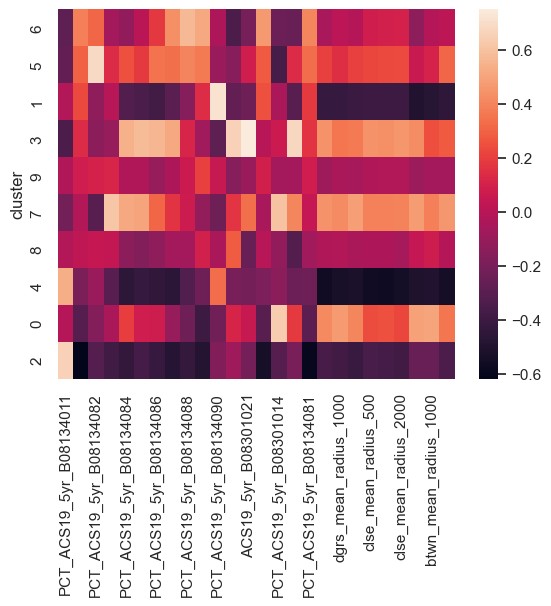

In [26]:
df_norm = (df - df.mean()) / (df.max() - df.min())
sns.heatmap(df_norm)